In [8]:
import cv2
import tensorflow as tf
from tensorflow.keras.layers import Input,Conv2D,ReLU,BatchNormalization,LeakyReLU
import numpy as np
import matplotlib.pyplot as plt
import rasterio as rs
from rasterio import plot

In [2]:
def normalize(img,minimum=0,maximum=1):
    img_max = np.max(img)
    img_min = np.min(img)
    return (img-img_min)/np.abs(img_max-img_min)*(maximum-minimum)+minimum

def speckle_noise(img,var=.05,seed=42,min_val=0,max_val=1):
    normalized_img = normalize(img)
    upper_band = (12*var)**.5
    np.random.seed(seed)
    noise = np.random.uniform(-upper_band/2,upper_band/2,size=img.shape)
    noisy_img = normalized_img*(1+noise)
    noisy_img = np.clip(noisy_img,0,1)
    ret_val = normalize(noisy_img,minimum=min_val,maximum=max_val)
    return ret_val

In [3]:
def self_attention(x):
    # First getting the shape of the input tensor
    batch_size, height, width, filters = K.int_shape(x)

    # Then flattening the dimensions
    reshaped_x = Reshape((height * width, filters))(x)

    # Then calculating the attention weights with softmax activation function
    attention_weights = Dense(height * width, activation='softmax')(reshaped_x)

    # Then applying the attention weights to the reshaped input
    attention_features = Dense(filters)(attention_weights)
    attention_features = Reshape((height, width, filters))(attention_features)

    # Finally combining the attention features with the original input
    x = Add()([attention_features, x])
    return x

def SARnet(input_shape=(256,256,1)):
    input_layer = Input(shape=input_shape)
    x = Conv2D(filters=64, kernel_size=(3,3), padding='same')(input_layer)
    x = ReLU()(x)

    # Defining a function for a convolutional block
    def conv_block(x, filters, kernel_size, padding='same', use_batch_norm=False):
        x = Conv2D(filters=filters, kernel_size=kernel_size, padding=padding)(x)
        if use_batch_norm:
            x = BatchNormalization()(x)
            x = ReLU()(x)
        return x

    # Adding convolutional blocks with skip connections
    for i in range(1, 23):
        skip_connection = x
        x = conv_block(x, filters=64, kernel_size=(3,3), use_batch_norm=i % 2 == 0)
        if i % 2 == 0:
            x = Add()([skip_connection, x])  # Adding skip connection every 2nd layers

        # Appling self-attention based on the every 5th layers
        if i % 5 == 0:
            x = self_attention(x)

    # Final convolutional layer
    x = conv_block(x, filters=1, kernel_size=(3,3))
    x = Lambda(lambda x: x + tf.constant(1e-7))(x)
    x = tf.math.divide(input_layer, x)
    x = tf.math.tanh(x)

    return tf.keras.Model(inputs=input_layer, outputs=x)

In [10]:
model=create_model([500,500,1])
model.load_weights('./SARnet_model.h5')

In [11]:
def denoise(network,img,tr,verbose=False):
    if len(img.shape)<3:
        img = np.expand_dims(img,axis=[0,-1])
    if len(img.shape)<4:
        img = np.expand_dims(img,axis=[0])
    if img.max()>1:
        img_tensor = tf.constant(img/255)
    else:
        img_tensor = tf.constant(img)
    despeckeled = SARnet(img_tensor)
    
    return normalize(despeckeled.numpy(),maximum=255).squeeze()

In [12]:
tr = .03
var = .5
shape = (500,500)
img1 = cv2.imread('a1.jpg',0)/255
img2 = cv2.imread('b1.jpg',0)/255
img3 = rs.plot.reshape_as_image(rs.open('img1a.tif').read())[:500,:500]
img3 = np.clip(img3,-20,  2)
# img3 = img3/50
img3 = normalize(img3)
img4 = cv2.imread('reeses_puffs.png',0)[:]
img4 = speckle_noise(img4,var=var,seed=42,min_val=0,max_val=1)

imgs = [img1,img2,img3,img4]
imgs = [cv2.resize(img,shape)[:,:,np.newaxis] for img in imgs ]
despeckled_imgs = [denoise(model,img,tr,verbose=False) for img in imgs]

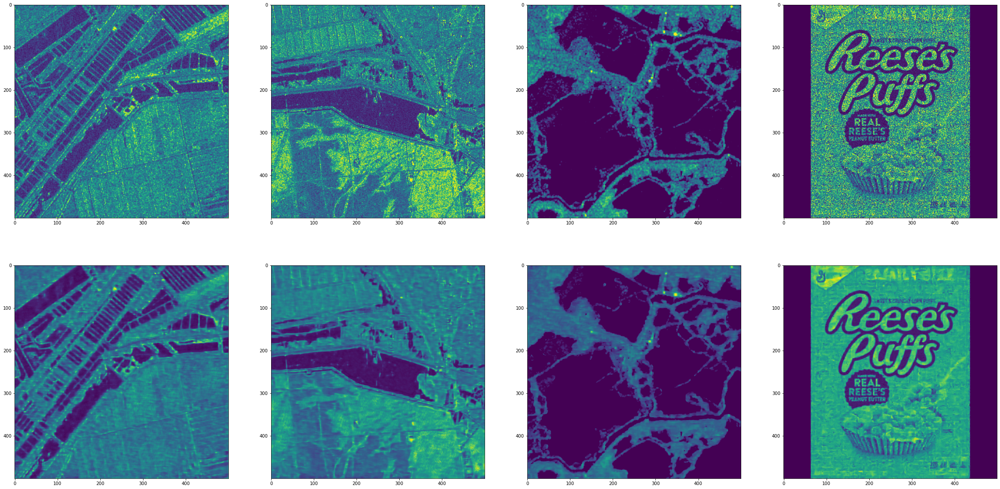

In [13]:
fig,ax = plt.subplots(2,4,figsize=(40,20))
for i in range(4):
    ax[0,i].imshow(imgs[i])
    ax[1,i].imshow(despeckled_imgs[i])    

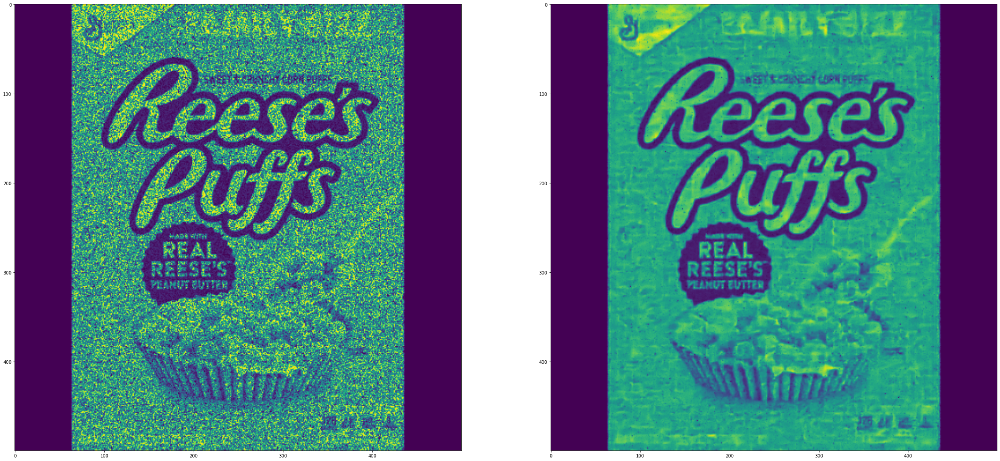

In [18]:
fig, ax =plt.subplots(1,2,figsize=(40,20))
ax[0].imshow(imgs[-1])
ax[1].imshow(despeckled_imgs[-1])

In [19]:
fig.savefig('example.jpg')

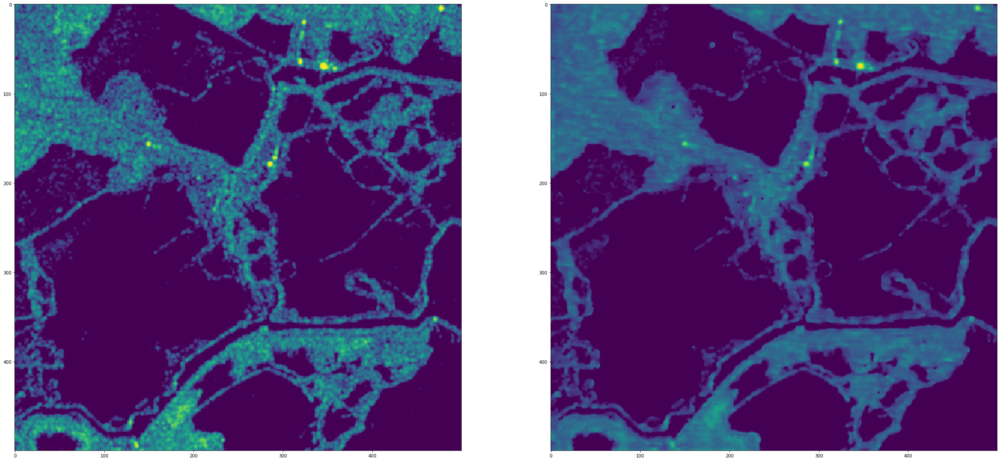

In [15]:
fig, ax =plt.subplots(1,2,figsize=(40,20))
ax[0].imshow(imgs[2])
ax[1].imshow(despeckled_imgs[2])

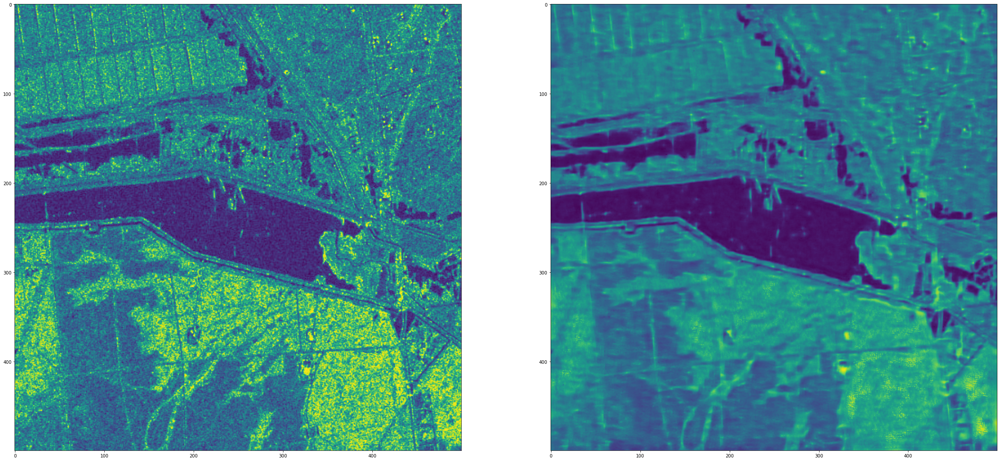

In [16]:
fig, ax =plt.subplots(1,2,figsize=(40,20))
ax[0].imshow(imgs[1])
ax[1].imshow(despeckled_imgs[1])

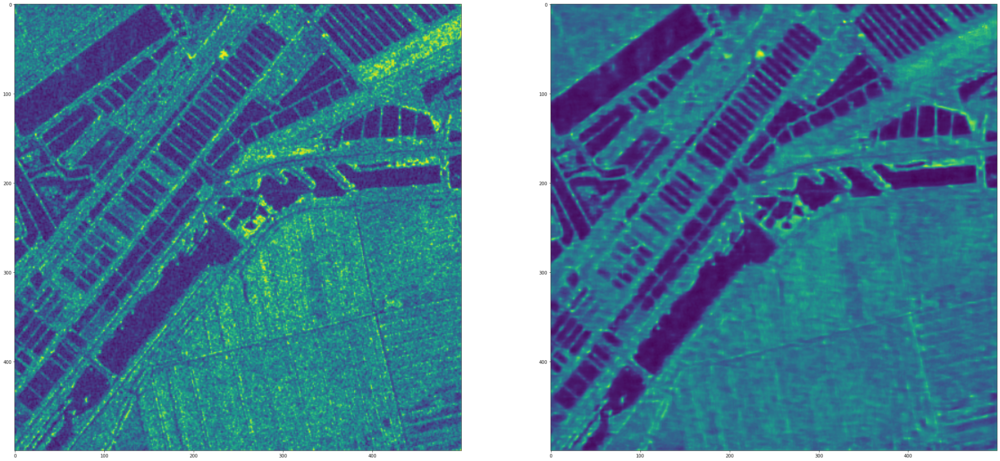

In [17]:
fig, ax =plt.subplots(1,2,figsize=(40,20))
ax[0].imshow(imgs[0])
ax[1].imshow(despeckled_imgs[0])